<a href="https://colab.research.google.com/github/dcastf01/object_detection_TFM/blob/main/Scaled_YOLOv4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# How to Train Scaled-YOLOv4 on Custom Objects

Scaled-YOLOv4 uses the same training procedures as YOLOv5.

This tutorial is based on the [YOLOv5 repository](https://github.com/ultralytics/yolov5) by [Ultralytics](https://www.ultralytics.com/). This notebook shows training on **your own custom objects**. Many thanks to Ultralytics for putting this repository together - we hope that in combination with clean data management tools at Roboflow, this technologoy will become easily accessible to any developer wishing to use computer vision in their projects.

### Accompanying Blog Post

A blog on Scaled-YOLOv4 is to come, in the meantime having the blog for [how to train YOLOv5](https://blog.roboflow.ai/how-to-train-yolov5-on-a-custom-dataset/)will be useful.

### Steps Covered in this Tutorial

In this tutorial, we will walk through the steps required to train Scaled-YOLOv4 on your custom objects. We use a [public blood cell detection dataset](https://public.roboflow.ai/object-detection/bccd), which is open source and free to use. You can also use this notebook on your own data.

To train our detector we take the following steps:

* Install Scaled-YOLOv4 dependencies
* Download custom Scaled-YOLOv4 object detection data
* Write our Scaled-YOLOv4 Training configuration
* Run Scaled-YOLOv4 training
* Evaluate Scaled-YOLOv4 performance
* Visualize Scaled-YOLOv4 training data
* Run Scaled-YOLOv4 inference on test images
* Export saved Scaled-YOLOv4 weights for future inference



### **About**

[Roboflow](https://roboflow.com) enables teams to deploy custom computer vision models quickly and accurately. Convert data from to annotation format, assess dataset health, preprocess, augment, and more. It's free for your first 1000 source images.

**Looking for a vision model available via API without hassle? Try Roboflow Train.**

![Roboflow Wordmark](https://ucd5150861f0b72b393669281023.previews.dropboxusercontent.com/p/thumb/AA-XyIcr8uqT6ZWpKsHJp_vv_zW-k012FwUIwyy3OJGF88VvLOpOzfB67EFFnEOKyXsKW3VG8qBENNkR4P2w1ZQd6SEBDfpBnYcLRw-9T_Fx2teCZpQTY33FHsPserUYfiZCyrfZpRRdgn7A4x34bhRu0_uwZvnx9q9Y804YL7DDX1MnD_omfZRuNDsetojhW3CwoQN6_srexqynYgQrzYKt4syhKF23FawIUP4-g1irhcH5Zh25GJNxVx-B0ZL9hB3VS-w9RA68lbvQvHOm_qvrQ0sXzwClHWMJNcricHssKyscqmnB8H_h2JWqJUgQk8DXeq7EeT6aHAoLsEwSEUhU0Q0B3IhLBY5_O0bee759pA/p.png?fv_content=true&size_mode=5)



#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [ ]:
# clone Scaled_YOLOv4
!git clone https://github.com/WongKinYiu/ScaledYOLOv4.git  # clone repo
%cd /content/ScaledYOLOv4/
#checkout the yolov4-large branch
!git checkout yolov4-large

Cloning into 'ScaledYOLOv4'...
remote: Enumerating objects: 6, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 115 (delta 1), reused 1 (delta 0), pack-reused 109
Receiving objects: 100% (115/115), 336.06 KiB | 1.33 MiB/s, done.
Resolving deltas: 100% (44/44), done.
/content/ScaledYOLOv4
Branch 'yolov4-large' set up to track remote branch 'yolov4-large' from 'origin'.
Switched to a new branch 'yolov4-large'


In [ ]:
#install mish activation funciton for cuda
%cd /content/
!git clone https://github.com/JunnYu/mish-cuda
%cd mish-cuda
!python setup.py build install

/content
Cloning into 'mish-cuda'...
remote: Enumerating objects: 85, done.
remote: Counting objects: 100% (85/85), done.
remote: Compressing objects: 100% (71/71), done.
remote: Total 192 (delta 5), reused 80 (delta 4), pack-reused 107
Receiving objects: 100% (192/192), 208.06 KiB | 914.00 KiB/s, done.
Resolving deltas: 100% (54/54), done.
/content/mish-cuda
/usr/lib/python3.6/distutils/extension.py:131: UserWarning: Unknown Extension options: 'headers'
  warnings.warn(msg)
running build
running build_py
creating build
creating build/lib.linux-x86_64-3.6
creating build/lib.linux-x86_64-3.6/mish_cuda
copying src/mish_cuda/__init__.py -> build/lib.linux-x86_64-3.6/mish_cuda
running egg_info
creating src/mish_cuda.egg-info
writing src/mish_cuda.egg-info/PKG-INFO
writing dependency_links to src/mish_cuda.egg-info/dependency_links.txt
writing requirements to src/mish_cuda.egg-info/requires.txt
writing top-level names to src/mish_cuda.egg-info/top_level.txt
writing manifest file 'src/mish_c

In [ ]:
!pip install -U PyYAML

     |████████████████████████████████| 276kB 13.3MB/s 
  Created wheel for PyYAML: filename=PyYAML-5.3.1-cp36-cp36m-linux_x86_64.whl size=44620 sha256=933581ea17250106a636e99e9e9cd768580225d9452144562ef77602c049ac54
  Stored in directory: /root/.cache/pip/wheels/a7/c1/ea/cf5bd31012e735dc1dfea3131a2d5eae7978b251083d6247bd
Successfully built PyYAML
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
%cd /content/ScaledYOLOv4/


/content/ScaledYOLOv4


# Download Correctly Formatted Custom Dataset 

We'll download our dataset from Roboflow. Use the "**YOLOv5 PyTorch**" export format. Note that the Ultralytics implementation calls for a YAML file defining where your training and test data is. The Roboflow export also writes this format for us.

To get your data into Roboflow, follow the [Getting Started Guide](https://blog.roboflow.ai/getting-started-with-roboflow/).



![YOLOv5 PyTorch export](https://i.imgur.com/5vr9G2u.png)


In [ ]:
# Export code snippet and paste here
%cd /content
!curl -L "https://app.roboflow.com/ds/h91wwIw5An?key=[YOUR KEY HERE]" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   896  100   896    0     0   1144      0 --:--:-- --:--:-- --:--:--  1144
100 35.6M  100 35.6M    0     0  20.4M      0  0:00:01  0:00:01 --:--:-- 85.4M
Archive:  roboflow.zip
 extracting: test/images/DJI_0267_JPG.rf.659fc518abe4994a0a04b681103029cc.jpg  
 extracting: test/images/DJI_0289_JPG.rf.7d2ce495fb2d3a19962e761e718c3a5e.jpg  
 extracting: test/images/DJI_0267_JPG.rf.12b4ae5e9e4ac08da13f17c5e555fd8f.jpg  
 extracting: test/images/DJI_0267_JPG.rf.0a39d3f51902b67bf0162fe19793d9aa.jpg  
 extracting: test/images/DJI_0262_JPG.rf.8c378a23b8822f63a44ad24c8787fab3.jpg  
 extracting: test/images/DJI_0316_JPG.rf.2406ceec1ba7c548483c4f2e33c674b9.jpg  
 extracting: test/images/DJI_0312_JPG.rf.783c9643ea6b0f5cc51eff20b27af449.jpg  
 extracting: test/images/DJI_0312_JPG.rf.544df0e3a7b2778052c9110942b032a7.jpg  
 extracting:

In [ ]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat data.yaml

cat: data.yaml: No such file or directory


#Inspect Model Configuration and Architecture

Let's look at the Scaled-YOLOv4 Configuration architecture

In [ ]:
%cat /content/ScaledYOLOv4/models/yolov4-csp.yaml

# parameters
nc: 80  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple

# anchors
anchors:
  - [12,16, 19,36, 40,28]  # P3/8
  - [36,75, 76,55, 72,146]  # P4/16
  - [142,110, 192,243, 459,401]  # P5/32

# yolov4-csp backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [32, 3, 1]],  # 0
   [-1, 1, Conv, [64, 3, 2]],  # 1-P1/2
   [-1, 1, Bottleneck, [64]],
   [-1, 1, Conv, [128, 3, 2]],  # 3-P2/4
   [-1, 2, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 5-P3/8
   [-1, 8, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 7-P4/16
   [-1, 8, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]], # 9-P5/32
   [-1, 4, BottleneckCSP, [1024]],  # 10
  ]

# yolov4-csp head
# na = len(anchors[0])
head:
  [[-1, 1, SPPCSP, [512]], # 11
   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [8, 1, Conv, [256, 1, 1]], # route backbone P4
   [[-1, -2], 1, Concat, [1]],
   [-1, 2, Bott

# Train Custom Scaled-YOLOv4 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights.
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [ ]:
# train scaled-YOLOv4 on custom data for 100 epochs
# time its performance
%%time
%cd /content/ScaledYOLOv4/
!python train.py --img 416 --batch 16 --epochs 50 --data '../data.yaml' --cfg ./models/yolov4-csp.yaml --weights '' --name yolov4-csp-results  --cache

/content/ScaledYOLOv4
Using CUDA device0 _CudaDeviceProperties(name='Tesla V100-SXM2-16GB', total_memory=16130MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/yolov4-csp.yaml', data='../data.yaml', device='', epochs=50, evolve=False, global_rank=-1, hyp='data/hyp.scratch.yaml', img_size=[416, 416], local_rank=-1, logdir='runs/', multi_scale=False, name='yolov4-csp-results', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, sync_bn=False, total_batch_size=16, weights='', world_size=1)
Start Tensorboard with "tensorboard --logdir runs/", view at http://localhost:6006/
2020-12-14 02:21:18.936295: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Hyperparameters {'lr0': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.5, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.01

# Evaluate Custom Scaled-YOLOv4 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
#from utils.general import plot_results  # plot results.txt as results.png
from IPython.display import Image, display
display(Image('/content/ScaledYOLOv4/runs/exp1_yolov4-csp-results/results.png'))  # view results.png

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

GROUND TRUTH TRAINING DATA:


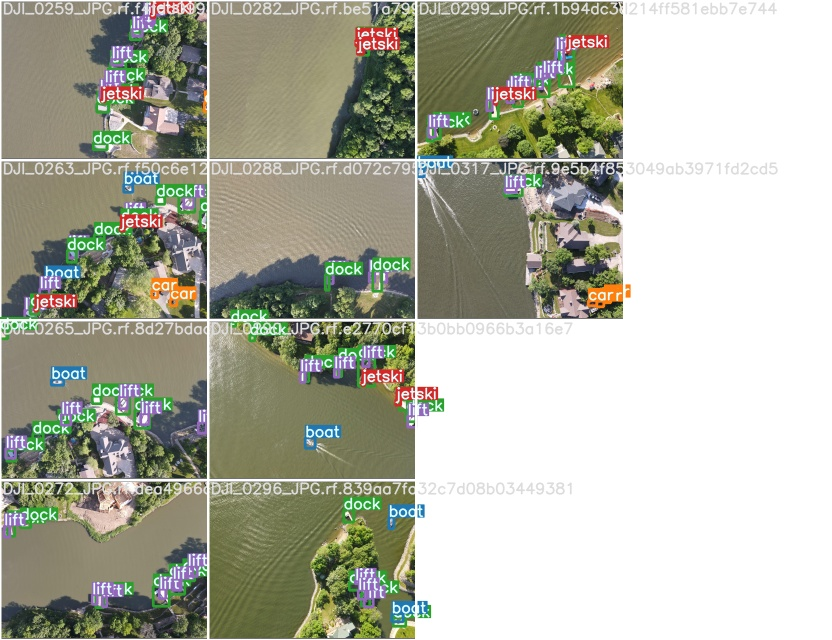

In [ ]:
# first, display our ground truth data
print("GROUND TRUTH TRAINING DATA:")
Image(filename='/content/ScaledYOLOv4/runs/exp0_yolov4-csp-results/test_batch0_gt.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


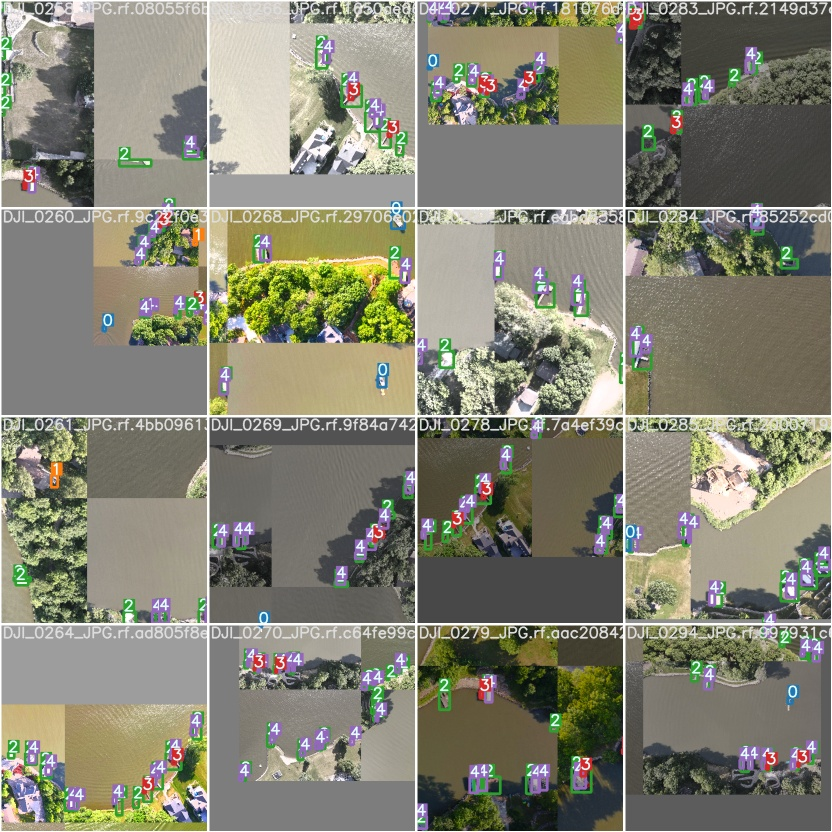

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/ScaledYOLOv4/runs/exp0_yolov4-csp-results/train_batch0.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

exp0_yolov4-csp-results/  exp1_yolov4-csp-results/


In [ ]:
%ls ./runs/exp0_yolov4-csp-results/weights

best.pt      last_024.pt  last_029.pt  last_034.pt  last_039.pt  last.pt
last_020.pt  last_025.pt  last_030.pt  last_035.pt  last_040.pt
last_021.pt  last_026.pt  last_031.pt  last_036.pt  last_041.pt
last_022.pt  last_027.pt  last_032.pt  last_037.pt  last_042.pt
last_023.pt  last_028.pt  last_033.pt  last_038.pt  last_043.pt


In [ ]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/ScaledYOLOv4/
!python detect.py --weights ./runs/exp0_yolov4-csp-results/weights/best.pt --img 416 --conf 0.4 --source ../test/images

/content/ScaledYOLOv4
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=416, iou_thres=0.5, output='inference/output', save_txt=False, source='../test/images', update=False, view_img=False, weights=['./runs/exp1_yolov4-csp-results/weights/best.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla V100-SXM2-16GB', total_memory=16130MB)

Fusing layers... Model Summary: 235 layers, 5.24921e+07 parameters, 5.04494e+07 gradients
image 1/32 /content/test/images/DJI_0262_JPG.rf.3878c367b5f00b7ce0f5c9bdcb4d8486.jpg: 416x416 Done. (0.020s)
image 2/32 /content/test/images/DJI_0262_JPG.rf.47ce7cf6d8e3e310ab9b2b5c15ebba72.jpg: 416x416 Done. (0.020s)
image 3/32 /content/test/images/DJI_0262_JPG.rf.560b36a2e292c1b3dee7eae7e1f3fbf0.jpg: 416x416 1 docks, Done. (0.021s)
image 4/32 /content/test/images/DJI_0262_JPG.rf.5f24b2ccccf544d3bb0c3cb740be0f4b.jpg: 416x416 1 lifts, Done. (0.021s)
image 5/32 /content/test/images/DJI_0262_JPG.rf.66b031d30a28587d2c06

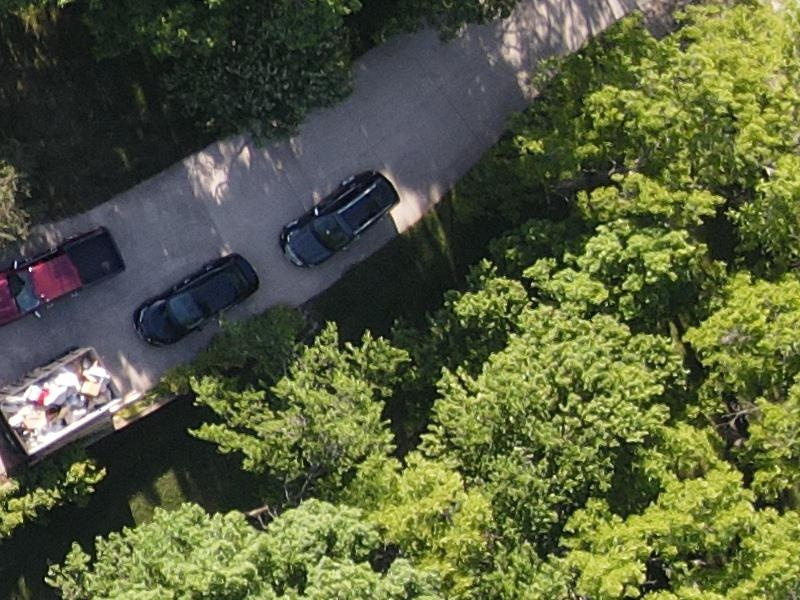

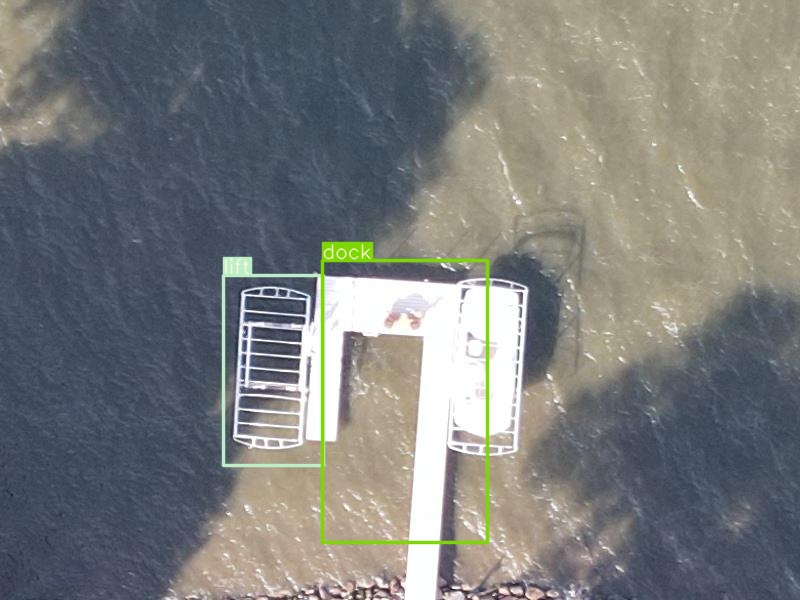

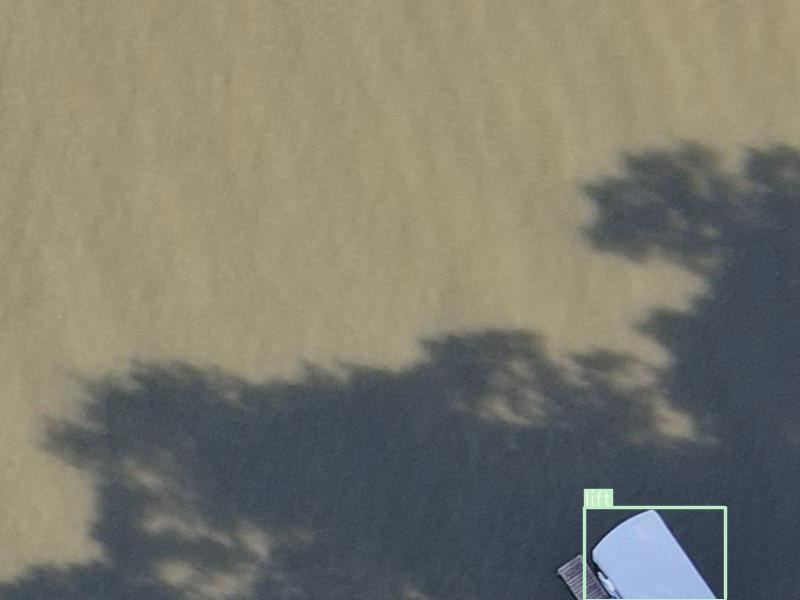

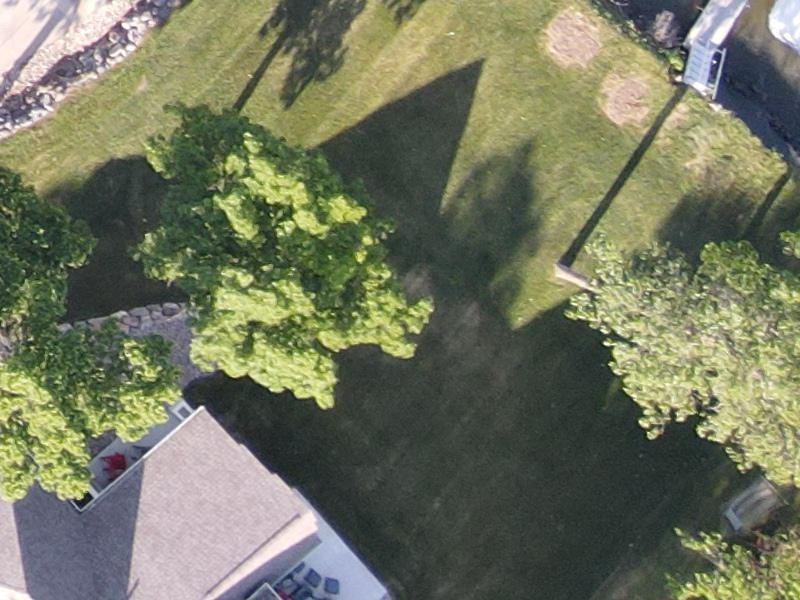

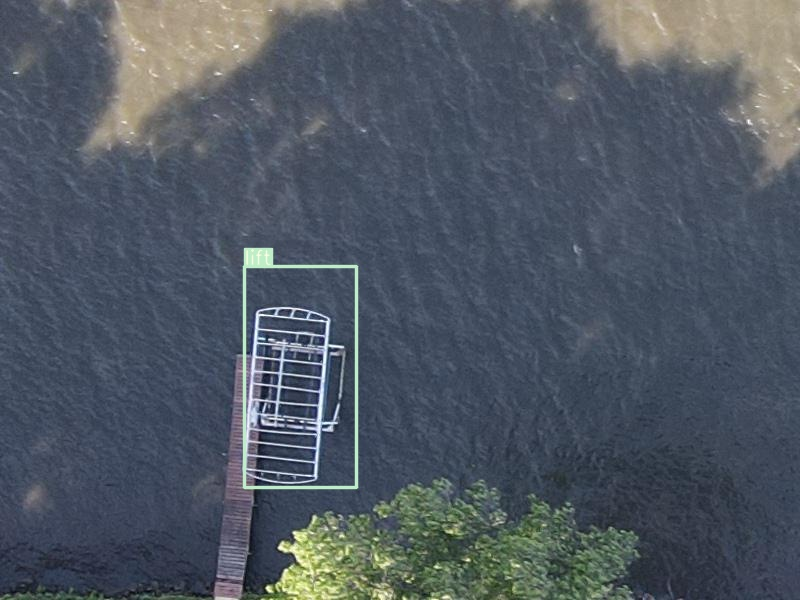

...

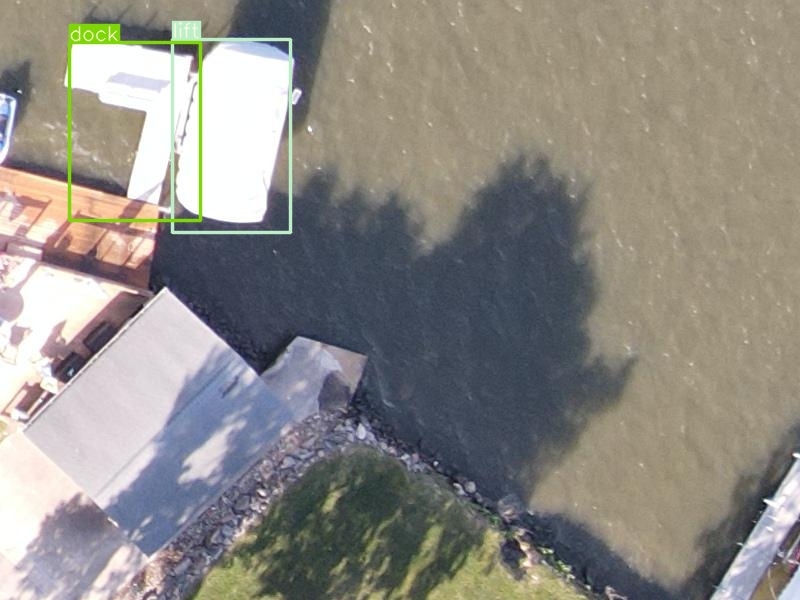

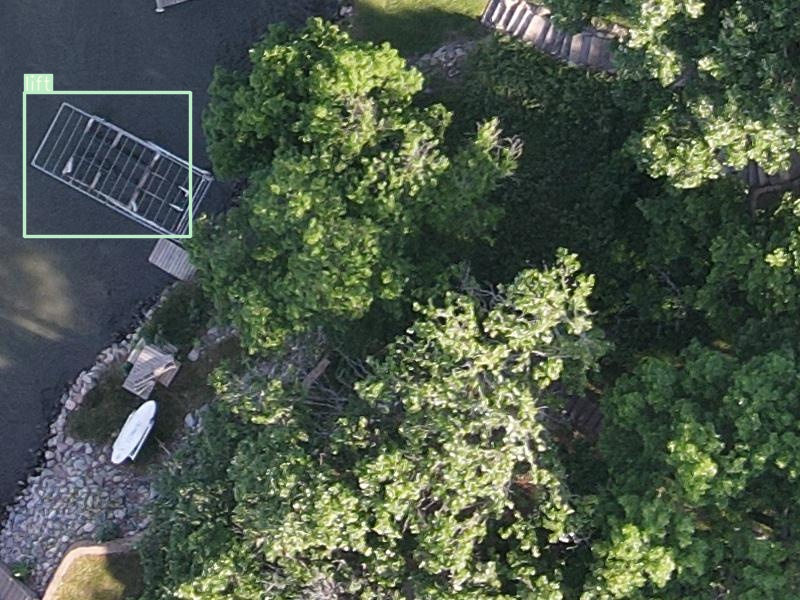

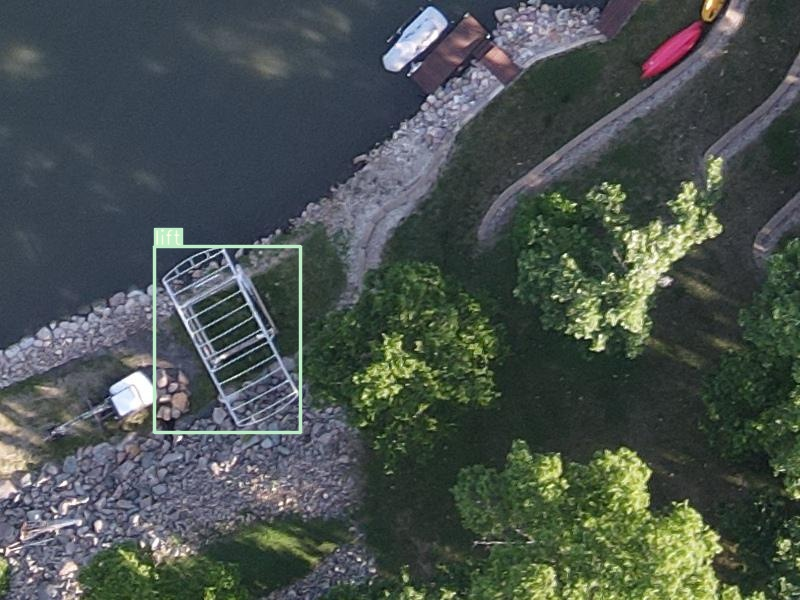

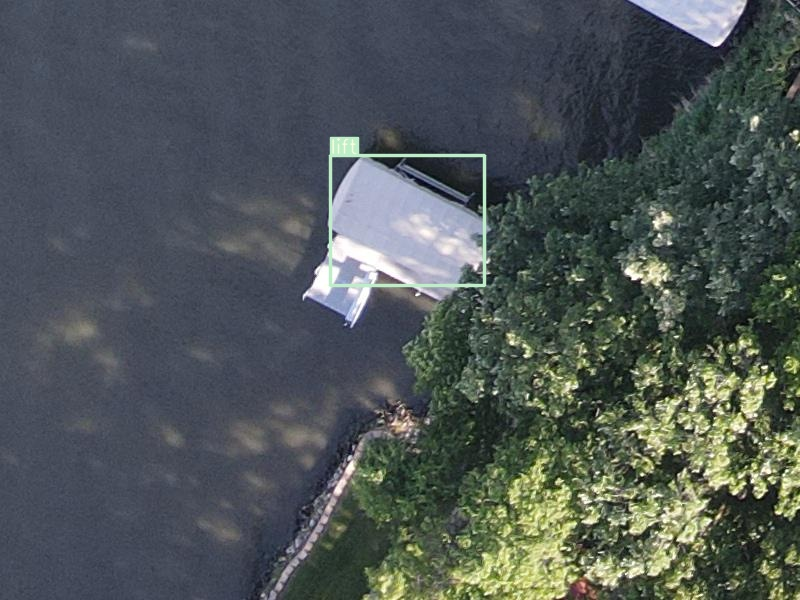

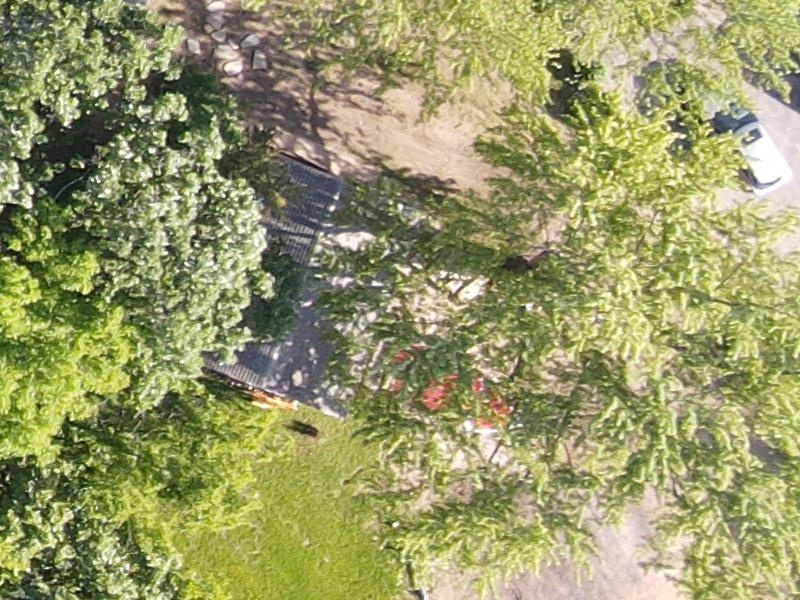

In [ ]:
#display inference on ALL test images
#this looks much better with longer training above
import glob
from IPython.display import Image, display

for imageName in glob.glob('./inference/output/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Export Trained Weights for Future Inference

Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [ ]:
from google.colab import files
files.download('./runs/exp0_yolov4-csp-results/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Congrats!

Hope you enjoyed this!

--Team [Roboflow](https://roboflow.ai)